In [1]:
import pandas as pd
import sys
print(sys.version)


3.8.13 (default, Mar 28 2022, 06:59:08) [MSC v.1916 64 bit (AMD64)]


In [2]:
import tensorflow as tf

print(tf.__version__)

if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available")


2.10.1
GPU is available


In [4]:
#!pip install git+https://github.com/NextBrain-ai/nbsynthetic.git
#pip install realtabformer
#!pip install ydata-synthetic==1.1.0   This one requires Python 3.9 and Tensorfloew 2.11
#!conda install -c conda-forge ctgan

# Prepare some data

In [2]:
df = pd.read_csv('data/real_data_gan1.csv')
df.head()

,Country,Business,Job,Level,Rating,Salary
0,Country_1,CORP,Job_Code_001,L1,1.0,110153.498927
1,Country_1,CORP,Job_Code_001,L1,1.0,107581.578469
2,Country_1,CORP,Job_Code_001,L1,1.0,120892.348763
3,Country_1,CORP,Job_Code_001,L1,1.0,110724.744901
4,Country_1,CORP,Job_Code_001,L1,1.0,104284.628410


In [3]:
# Declare Categorical Columns
cat_cols = [
    "Country",
    "Business",
    "Job",
    "Level",
    "Rating",
]

# Declare Continuous Columns
num_cols = ["Salary"]


In [4]:
#################################################################################################################

 # WGAN

In [42]:
import pandas as pd
import numpy as np
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.constraints import NonNeg
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
#from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import *

from scipy.stats import norm
from scipy import stats
import time
import math
import matplotlib.pyplot as plt

In [43]:
# 1. One-hot encode the categorical variables
encoder = OneHotEncoder()
encoded_categorical_data = encoder.fit_transform(df[cat_cols]).toarray()
encoded_categorical_cols = encoder.get_feature_names_out(cat_cols)

# 2. Normalize the numerical variables
scaler = StandardScaler()
normalized_numerical_data = scaler.fit_transform(df[num_cols])

# Combine the data
X = np.hstack([normalized_numerical_data, encoded_categorical_data])

In [44]:
# 1. Define the Generator and Critic models

class Generator(keras.Model):
    def __init__(self, latent_dim, output_dim):
        super(Generator, self).__init__()
        self.fc1 = keras.layers.Dense(256)
        self.act1 = keras.layers.LeakyReLU(0.2)
        self.dropout1 = keras.layers.Dropout(0.4)  
        self.fc2 = keras.layers.Dense(256)
        self.act2 = keras.layers.LeakyReLU(0.2)
        self.dropout2 = keras.layers.Dropout(0.4) 
        self.out = keras.layers.Dense(output_dim)

    def call(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.dropout2(x)
        return self.out(x)

class Critic(keras.Model):
    def __init__(self, input_dim):
        super(Critic, self).__init__()
        self.fc1 = keras.layers.Dense(256)
        self.act1 = keras.layers.LeakyReLU(0.2)
        self.dropout1 = keras.layers.Dropout(0.4)  
        self.fc2 = keras.layers.Dense(256)
        self.act2 = keras.layers.LeakyReLU(0.2)
        self.dropout2 = keras.layers.Dropout(0.4)  
        self.out = keras.layers.Dense(1)

    def call(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.dropout2(x)
        return self.out(x)

# 2. Implement the WGAN training loop

class WGAN(keras.Model):
    def __init__(self, latent_dim, data_dim, critic_iters=5, lambda_gp=10.0):
        super(WGAN, self).__init__()
        self.generator = Generator(latent_dim, data_dim)
        self.critic = Critic(data_dim)
        self.latent_dim = latent_dim
        self.critic_iters = critic_iters
        self.lambda_gp = lambda_gp

    def compile(self, g_optimizer, c_optimizer, g_loss_fn, c_loss_fn):
        super(WGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.c_optimizer = c_optimizer
        self.g_loss_fn = g_loss_fn
        self.c_loss_fn = c_loss_fn

    def gradient_penalty(self, real_data, fake_data):
        alpha = tf.random.uniform([tf.shape(real_data)[0], 1], 0., 1.)
        interpolated = alpha * real_data + (1. - alpha) * fake_data
        with tf.GradientTape() as tape:
            tape.watch(interpolated)
            validity = self.critic(interpolated)
        gradients = tape.gradient(validity, interpolated)
        gradient_norm = tf.sqrt(tf.reduce_sum(gradients**2, axis=1))
        gp = tf.reduce_mean((gradient_norm - 1.0) ** 2)
        return gp

    def train_step(self, real_data):
        batch_size = tf.shape(real_data)[0]
        
        # Train Critic
        for _ in range(self.critic_iters):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_data = self.generator(random_latent_vectors)
            with tf.GradientTape() as tape:
                fake_logits = self.critic(generated_data)
                real_logits = self.critic(real_data)
                
                c_loss = self.c_loss_fn(real_logits, fake_logits)
                gp = self.gradient_penalty(real_data, generated_data)
                c_loss += self.lambda_gp * gp
                
            c_gradients = tape.gradient(c_loss, self.critic.trainable_weights)
            self.c_optimizer.apply_gradients(zip(c_gradients, self.critic.trainable_weights))
        
        # Train Generator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            generated_data = self.generator(random_latent_vectors)
            fake_logits = self.critic(generated_data)
            g_loss = self.g_loss_fn(fake_logits)
        
        g_gradients = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(g_gradients, self.generator.trainable_weights))
        
        return {'c_loss': c_loss, 'g_loss': g_loss}
    
    def generate_samples(self, num_samples):
        # Generate random latent vectors
        random_latent_vectors = tf.random.normal(shape=(num_samples, self.latent_dim))

        # Get synthetic samples from the generator
        generated_samples = self.generator(random_latent_vectors)

        return generated_samples.numpy()

# Define the custom loss functions
def critic_loss(real_logits, fake_logits):
    return tf.reduce_mean(fake_logits) - tf.reduce_mean(real_logits)

def generator_loss(fake_logits):
    return -tf.reduce_mean(fake_logits)



In [45]:
# Get ready to Train
latent_dim = X.shape[1]
data_dim = X.shape[1]

wgan = WGAN(latent_dim, data_dim)

wgan.compile(
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9),
    c_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9),
    g_loss_fn=generator_loss,
    c_loss_fn=critic_loss
)


In [46]:
# Train the WGAN
wgan.fit(X, epochs=1000, batch_size=256)


Epoch 1/1000
782/782 [==============================] - 17s 19ms/step - c_loss: -0.7856 - g_loss: 0.7973
Epoch 2/1000
782/782 [==============================] - 14s 18ms/step - c_loss: -0.9463 - g_loss: 2.6870
Epoch 3/1000
782/782 [==============================] - 14s 18ms/step - c_loss: -0.8745 - g_loss: 2.9361
Epoch 4/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.7760 - g_loss: 3.3393
Epoch 5/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.6836 - g_loss: 3.6920
Epoch 6/1000
782/782 [==============================] - 14s 18ms/step - c_loss: -0.6062 - g_loss: 3.9295
Epoch 7/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.5437 - g_loss: 4.1072
Epoch 8/1000
782/782 [==============================] - 15s 19ms/step - c_loss: -0.4926 - g_loss: 4.2639
Epoch 9/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.4541 - g_loss: 4.3334
Epoch 10/1000
782/782 [==============================] 

782/782 [==============================] - 15s 19ms/step - c_loss: -0.1790 - g_loss: -1.2055
Epoch 79/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1784 - g_loss: -1.2405
Epoch 80/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1792 - g_loss: -1.3027
Epoch 81/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1770 - g_loss: -1.3043
Epoch 82/1000
782/782 [==============================] - 16s 20ms/step - c_loss: -0.1766 - g_loss: -1.3664
Epoch 83/1000
782/782 [==============================] - 18s 23ms/step - c_loss: -0.1763 - g_loss: -1.3691
Epoch 84/1000
782/782 [==============================] - 16s 21ms/step - c_loss: -0.1754 - g_loss: -1.3775
Epoch 85/1000
782/782 [==============================] - 15s 19ms/step - c_loss: -0.1749 - g_loss: -1.4229
Epoch 86/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1751 - g_loss: -1.4281
Epoch 87/1000
782/782 [============================

Epoch 230/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1393 - g_loss: -2.1676
Epoch 231/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1380 - g_loss: -2.1695
Epoch 232/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1389 - g_loss: -2.1947
Epoch 233/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1384 - g_loss: -2.2128
Epoch 234/1000
782/782 [==============================] - 14s 18ms/step - c_loss: -0.1380 - g_loss: -2.2332
Epoch 235/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1371 - g_loss: -2.2404
Epoch 236/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1375 - g_loss: -2.2286
Epoch 237/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1377 - g_loss: -2.2144
Epoch 238/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1382 - g_loss: -2.2232
Epoch 239/1000
782/782 [====

Epoch 381/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1250 - g_loss: -2.9608
Epoch 382/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1245 - g_loss: -2.9494
Epoch 383/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1245 - g_loss: -2.9328
Epoch 384/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1243 - g_loss: -2.9646
Epoch 385/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1241 - g_loss: -2.9867
Epoch 386/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1232 - g_loss: -2.9808
Epoch 387/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1233 - g_loss: -2.9816
Epoch 388/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1241 - g_loss: -3.0106
Epoch 389/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1236 - g_loss: -3.0091
Epoch 390/1000
782/782 [====

Epoch 532/1000
782/782 [==============================] - 12s 15ms/step - c_loss: -0.1177 - g_loss: -3.5612
Epoch 533/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1186 - g_loss: -3.5832
Epoch 534/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1181 - g_loss: -3.6047
Epoch 535/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1173 - g_loss: -3.5883
Epoch 536/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1177 - g_loss: -3.5993
Epoch 537/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1180 - g_loss: -3.5607
Epoch 538/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1182 - g_loss: -3.5920
Epoch 539/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1181 - g_loss: -3.5373
Epoch 540/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1182 - g_loss: -3.5771
Epoch 541/1000
782/782 [====

Epoch 683/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1116 - g_loss: -3.3497
Epoch 684/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1124 - g_loss: -3.3903
Epoch 685/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1127 - g_loss: -3.3577
Epoch 686/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1127 - g_loss: -3.3539
Epoch 687/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1124 - g_loss: -3.3389
Epoch 688/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1117 - g_loss: -3.3764
Epoch 689/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1121 - g_loss: -3.3459
Epoch 690/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1129 - g_loss: -3.3620
Epoch 691/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1126 - g_loss: -3.3589
Epoch 692/1000
782/782 [====

Epoch 834/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1097 - g_loss: -3.6797
Epoch 835/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1101 - g_loss: -3.6749
Epoch 836/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1088 - g_loss: -3.6855
Epoch 837/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1097 - g_loss: -3.6945
Epoch 838/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1102 - g_loss: -3.6723
Epoch 839/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1095 - g_loss: -3.6491
Epoch 840/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1099 - g_loss: -3.6827
Epoch 841/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1094 - g_loss: -3.6448
Epoch 842/1000
782/782 [==============================] - 13s 16ms/step - c_loss: -0.1097 - g_loss: -3.6830
Epoch 843/1000
782/782 [====

Epoch 985/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1058 - g_loss: -3.7698
Epoch 986/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1055 - g_loss: -3.7928
Epoch 987/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1061 - g_loss: -3.7918
Epoch 988/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1061 - g_loss: -3.7656
Epoch 989/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1056 - g_loss: -3.7500
Epoch 990/1000
782/782 [==============================] - 12s 16ms/step - c_loss: -0.1061 - g_loss: -3.7597
Epoch 991/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1066 - g_loss: -3.7708
Epoch 992/1000
782/782 [==============================] - 14s 17ms/step - c_loss: -0.1062 - g_loss: -3.7430
Epoch 993/1000
782/782 [==============================] - 13s 17ms/step - c_loss: -0.1057 - g_loss: -3.7855
Epoch 994/1000
782/782 [====

In [47]:
#def generate_samples(model, num_samples):
#    # Generate random latent vectors
#    random_latent_vectors = tf.random.normal(shape=(num_samples, model.latent_dim))
    
    # Get synthetic samples from the generator
#    generated_samples = model.generator(random_latent_vectors)
    
#    return generated_samples.numpy()


In [49]:
# 4. Generate synthetic data (replace with actual generation code)

#synthetic_data = generate_samples(wgan, X.shape[0])
synthetic_data = wgan.generate_samples(X.shape[0])

# 5. Decode the synthetic data
# Split the synthetic data to numerical and categorical
synthetic_numerical_data = synthetic_data[:, :len(num_cols)]
synthetic_categorical_data = synthetic_data[:, len(num_cols):]

# Reverse normalization for numerical data
decoded_numerical_data = scaler.inverse_transform(synthetic_numerical_data)

# Reverse one-hot encoding for categorical data
decoded_categorical_data = encoder.inverse_transform(synthetic_categorical_data)

# Combine decoded data into a DataFrame
decoded_df = pd.DataFrame(decoded_numerical_data, columns=num_cols)
decoded_categorical_df = pd.DataFrame(decoded_categorical_data, columns=cat_cols)
decoded_df = pd.concat([decoded_df, decoded_categorical_df], axis=1)

synthetic_data_combined = decoded_df.copy()


In [50]:
synthetic_data_combined

,Salary,Country,Business,Job,Level,Rating
0,"193,457.1406",Country_2,SALES,Job_Code_001,L3,1.0000
1,"6,865.5459",Country_4,SALES,Job_Code_003,L1,3.0000
2,"71,878.5469",Country_3,CORP,Job_Code_003,L4,2.0000
3,"36,693.9844",Country_4,SALES,Job_Code_001,L4,1.0000
4,"84,666.5312",Country_3,SALES,Job_Code_002,L2,1.0000
...,...,...,...,...,...,...
199979,"339,770.2500",Country_1,SALES,Job_Code_003,L5,3.0000
199980,"90,155.3828",Country_1,CORP,Job_Code_001,L1,3.0000
199981,"5,002.1553",Country_4,CORP,Job_Code_001,L1,1.0000
199982,"196,974.8750",Country_1,CORP,Job_Code_002,L3,3.0000


In [51]:
synthetic_data_combined.to_csv('data/wgan_salaryC.csv',index=False)
# A was with 1000 epochs
# B was with 5000 epocs
# C was with 1000 epochs

In [52]:
####################################################################################################################
####################################################################################################################

# YDATA-Synthetic (This one required python 2.9+ but couldnt install
# due to issues with tensorflow) Run without GPU on synthetic-env or on Ubuntu

In [4]:
# Import the necessary modules
from pmlb import fetch_data
from ydata_synthetic.synthesizers.regular import RegularSynthesizer
from ydata_synthetic.synthesizers import ModelParameters, TrainParameters


# Define model and training parameters
ctgan_args = ModelParameters(batch_size=250, 
                            lr=2e-4, 
                            betas=(0.5, 0.9),
                            noise_dim=24,
                            latent_dim=24,
                            layers_dim=512)

train_args = TrainParameters(epochs=100)

# Train the generator model
synth = RegularSynthesizer(modelname='ctgan', model_parameters=ctgan_args)
synth.fit(data=df, train_arguments=train_args, num_cols=num_cols, cat_cols=cat_cols)

# Generate 1000 new synthetic samples
ydata_data = synth.sample(len(df)) 

Epoch: 0 | critic_loss: 0.3476203978061676 | generator_loss: -0.763238251209259
Epoch: 1 | critic_loss: 0.018078118562698364 | generator_loss: -1.1715909242630005
Epoch: 2 | critic_loss: -0.08951257169246674 | generator_loss: -1.4770623445510864
Epoch: 3 | critic_loss: 0.024398058652877808 | generator_loss: -1.6198776960372925
Epoch: 4 | critic_loss: 0.06398431956768036 | generator_loss: -1.503449559211731
Epoch: 5 | critic_loss: 0.0029646530747413635 | generator_loss: -1.4064100980758667
Epoch: 6 | critic_loss: -0.17261424660682678 | generator_loss: -1.2591005563735962
Epoch: 7 | critic_loss: 0.23930296301841736 | generator_loss: -0.9556436538696289
Epoch: 8 | critic_loss: -0.0349305123090744 | generator_loss: -1.0375174283981323
Epoch: 9 | critic_loss: 0.15449267625808716 | generator_loss: -1.3562091588974
Epoch: 10 | critic_loss: 0.11908668279647827 | generator_loss: -0.7986133694648743
Epoch: 11 | critic_loss: 0.28140735626220703 | generator_loss: -0.9383033514022827
Epoch: 12 | cr

Epoch: 99 | critic_loss: 0.24019759893417358 | generator_loss: -0.512986958026886


In [5]:
ydata_data

,Country,Business,Job,Level,Rating,Salary
0,Country_2,SALES,Job_Code_003,L1,1.0,85400.710801
1,Country_4,SALES,Job_Code_004,L2,2.0,48499.869575
2,Country_4,CORP,Job_Code_004,L1,2.0,11860.440807
3,Country_3,SALES,Job_Code_003,L5,2.0,100119.972764
4,Country_4,SALES,Job_Code_004,L1,2.0,25024.439094
...,...,...,...,...,...,...
199979,Country_2,SALES,Job_Code_001,L2,3.0,107905.991691
199980,Country_2,SALES,Job_Code_004,L1,2.0,73352.216880
199981,Country_3,CORP,Job_Code_002,L2,2.0,50413.749180
199982,Country_4,SALES,Job_Code_004,L4,1.0,23887.650386


In [6]:
ydata_data.to_csv('data/ydata_salary.csv',index=False)

# NBSYNTHETIC

In [4]:
from nbsynthetic.data import input_data
from nbsynthetic.data_preparation import SmartBrain
from nbsynthetic.vgan import GAN
from nbsynthetic.synthetic import synthetic_data
from nbsynthetic.wgan import WGAN

df_nbsynthetic = input_data('data/real_data_gan1', decimal='.')
SB = SmartBrain() 
df_nbsynthetic = SB.nbEncode(df_nbsynthetic) 

samples= len(df_nbsynthetic)

nbsynthetic_data = synthetic_data(
    WGAN, 
    df_nbsynthetic, 
    samples = samples,
    initial_lr = 0.0001, 
    dropout = 0.3,
    epochs = 10,
    show_tqdm=False,
    )


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 72ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 70ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 64ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 202ms/step


1/1 [==============================] - 0s 67ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 67ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 66ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 63ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 68ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 63ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 69ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 63ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 66ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 68ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 64ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 138ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 66ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 69ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 63ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 70ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 64ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 76ms/step


1/1 [==============================] - 0s 83ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 67ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 68ms/step


1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 69ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 77ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 64ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 69ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 72ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 60ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 59ms/step


6250/6250 [==============================] - 22s 4ms/step


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\sklearn\preprocessing\_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\sklearn\preprocessing\_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\sklearn\preprocessing\_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
D:\ComputerCode\JF_Env

In [5]:
nbsynthetic_data

,Country,Business,Job,Level,Rating,Salary
0,0,1,3,4,1.081341,15553.738043
1,3,1,3,0,1.710882,333991.127991
2,3,1,1,0,1.167720,382946.730775
3,0,1,3,1,1.066683,165759.491239
4,2,1,3,0,2.480471,109581.075260
...,...,...,...,...,...,...
199979,1,1,3,1,1.976130,122304.010111
199980,3,1,0,0,2.182734,306492.110756
199981,0,0,1,4,3.218670,28369.488508
199982,3,1,2,0,3.048730,259036.870232


In [6]:
nbsynthetic_data.to_csv('data/nbsynthetic_salary.csv',index=False)

# RealTabFormer

In [78]:
import pandas as pd 
from realtabformer import REaLTabFormer

rtf_model=REaLTabFormer(model_type="tabular",gradient_accumulation_steps=4)

rtf_model.fit(df)

# Save the model to the current directory
# A new directory`rtf_model/`will be created.
# Init,a directory with the model's
# experimentid`idXXXX`will also be created
# where the artefacts of the model will be stored.

rtf_model.save("rtf_modelSal/")

#samples=rtf_model.sample(n_samples=len(df))
realtabformer_data = rtf_model.sample(n_samples=len(df))


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\realtabformer\realtabformer.py:534: UserWarning: The frac (0.165) set results to a sample larger than                     frac_max_data=10000. Setting frac to 0.0500040003200256.
  warnings.warn(
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\realtabformer\realtabformer.py:568: UserWarning: Duplicate rate (0.0) in the data is zero. The `qt_interval` will be set                     to qt_interval_unique=100.
  warnings.warn(


Computing the sensitivity threshold...
Using parallel computation!!!


Bootstrap round: 100%|███████████████████████████████████████████████████████████████| 500/500 [31:51<00:00,  3.82s/it]


Sensitivity threshold summary:
count   500.0000
mean      0.0000
std       0.0011
min      -0.0029
25%      -0.0008
50%      -0.0000
75%       0.0008
max       0.0039
dtype: float64
Sensitivity threshold: 0.00184141 qt_max: 0.05


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
100,1.847100
200,1.595300
300,1.570200
400,1.556800
500,1.548300
600,1.542100
700,1.534900
800,1.532200
900,1.530300
1000,1.527200


30080it [01:55, 260.65it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 5,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: -0.0006526000000000003,                             val_sensitivities: [-0.0013878000000000002, -9.060000000000016e-05, -0.0006061999999999998, 0.0004700000000000001, 0.0003314000000000001, -0.0001385999999999999, -0.0010485999999999998, -0.0020494000000000003, 0.0005061999999999998, -0.00045059999999999984, -0.0020352000000000005, 0.0012967999999999999, -0.002871800000000001, -0.0018914000000000005, 0.0001768000000000003]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
31300,1.487700
31400,1.485800
31500,1.487400
31600,1.483800
31700,1.487500
31800,1.486500
31900,1.486000
32000,1.486200
32100,1.486800
32200,1.486100


30080it [01:57, 256.36it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 10,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 3.359999999999966e-06,                             val_sensitivities: [-0.00025100000000000003, 0.0022947999999999996, 0.0017151999999999998, 0.0021122000000000003, 0.0010896000000000002, -0.0003276, -0.0001777999999999999, -0.0013527999999999995, -0.0009214, 7.119999999999987e-05, -0.0026046000000000003, 0.0022530000000000002, -0.0010714000000000001, -0.0021780000000000002, -0.000601]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
62500,1.482700
62600,1.481500
62700,1.481300
62800,1.482800
62900,1.487100
63000,1.483200
63100,1.482200
63200,1.481500
63300,1.485900
63400,1.484800


30080it [01:56, 259.00it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 15,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: -0.00024344,                             val_sensitivities: [-0.0006349999999999997, -0.0006816, -0.00016280000000000003, -0.00041020000000000016, 0.0010897999999999997, 4.020000000000025e-05, -0.0008091999999999996, -0.0021324, 0.0008083999999999999, 0.0013024, -0.0008262, 0.0014391999999999999, -0.0010149999999999998, -0.0015361999999999997, -0.00012300000000000006]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
93800,1.480600
93900,1.482800
94000,1.482900
94100,1.482000
94200,1.482400
94300,1.481500
94400,1.484700
94500,1.479700
94600,1.480600
94700,1.482900


30080it [01:56, 258.89it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 20,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: -0.00016269333333333334,                             val_sensitivities: [-0.0006090000000000002, 0.0007491999999999999, 0.0003648000000000002, 0.0017998, -0.00029000000000000006, -0.0007049999999999995, 3.600000000000003e-05, -0.0012894, -7.319999999999999e-05, -0.0012672, -0.0015832, 0.0023158000000000002, -0.0005928000000000001, -0.0012660000000000002, -3.0200000000000104e-05]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
125000,1.479700
125100,1.480200
125200,1.481900
125300,1.480000
125400,1.479700
125500,1.480800
125600,1.480100
125700,1.480600
125800,1.481400
125900,1.481500


30080it [02:00, 250.35it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 25,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: -0.0001860266666666666,                             val_sensitivities: [0.0006238000000000001, 0.0011362, 0.0006468000000000001, 0.0014956000000000004, -0.0008961999999999998, -0.0003712000000000001, -0.0006164, -0.0015141999999999996, 0.0013698000000000002, -0.00013740000000000017, -0.0012326, 0.0001358000000000003, -0.0009922000000000002, -0.0011874, -0.0012508]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
156300,1.479100
156400,1.480500
156500,1.477200
156600,1.479900
156700,1.481900
156800,1.478500
156900,1.481000
157000,1.479400
157100,1.477900
157200,1.480400


30080it [01:55, 261.06it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 30,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: -0.001464893333333333,                             val_sensitivities: [-0.0022462000000000003, -0.0005209999999999999, -0.0012196, -0.0016194000000000002, -0.0005595999999999998, -0.0002812, -0.0010238, -0.0017804000000000001, -0.0015409999999999996, -0.0004136000000000001, -0.0031849999999999995, -0.0004429999999999997, -0.0016905999999999998, -0.0025098, -0.0029392000000000003]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
187500,1.479600
187600,1.477800
187700,1.479500
187800,1.479100
187900,1.478700
188000,1.480200
188100,1.480200
188200,1.482000
188300,1.479300
188400,1.479500


30080it [01:54, 261.71it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 35,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 5.750666666666667e-05,                             val_sensitivities: [6.199999999999985e-05, 0.0009450000000000001, 0.0001132, 0.0008970000000000001, 0.0012871999999999996, -0.0003323999999999999, -1.4600000000000169e-05, -0.001084, -8.060000000000005e-05, 0.0004438000000000002, -0.0019223999999999999, 0.001379, -0.0011677999999999999, -0.00035780000000000013, 0.0006949999999999999]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
218800,1.479500
218900,1.483900
219000,1.478000
219100,1.479800
219200,1.479900
219300,1.478400
219400,1.478100
219500,1.478100
219600,1.479300
219700,1.477900


30080it [01:55, 259.89it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 40,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0013767333333333336,                             val_sensitivities: [1.3399999999999926e-05, 0.0018067999999999995, 0.0016486, 0.0027366, 0.000948, 0.0013172000000000001, 0.0005707999999999999, 0.0008383999999999997, 0.0011534, 0.0010911999999999999, 0.000417, 0.0030594, 0.0016074000000000001, 0.0011623999999999998, 0.0022804]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
250000,1.481200
250100,1.477900
250200,1.477000
250300,1.478300
250400,1.479600
250500,1.478000
250600,1.476700
250700,1.479400
250800,1.480300
250900,1.478000


30080it [01:57, 255.98it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 45,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.00124656,                             val_sensitivities: [0.0011972000000000003, 0.0014895999999999998, 0.0012058000000000001, 0.0026823999999999997, 0.0016838, 0.0012312000000000004, 6.559999999999983e-05, -0.0009842, 0.001331, 0.002613, 0.00018860000000000003, 0.0034742, -0.00016080000000000003, 0.0019073999999999999, 0.0007735999999999999]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
281300,1.474900
281400,1.478100
281500,1.478500
281600,1.477000
281700,1.477600
281800,1.475700
281900,1.477700
282000,1.477400
282100,1.477100
282200,1.476600


30080it [01:57, 255.07it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 50,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0015505999999999996,                             val_sensitivities: [0.001773, 0.0034455999999999996, 0.0024302000000000004, 0.0032075999999999997, 0.0022414, -0.0002762000000000001, -9.500000000000002e-05, 0.0006111999999999999, -0.0001292, 0.0015958, -0.0005015999999999999, 0.003966, 0.0009349999999999997, 0.0014073999999999998, 0.0026478000000000005]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
312500,1.477500
312600,1.476400
312700,1.476500
312800,1.478200
312900,1.475000
313000,1.474700
313100,1.473700
313200,1.476500
313300,1.477200
313400,1.478700


30080it [01:55, 259.51it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 55,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.00044966666666666674,                             val_sensitivities: [0.0009178000000000004, 0.0016973999999999997, 0.0025654, 0.0013968000000000003, 0.0002998, -0.00046339999999999977, -0.0012693999999999997, -0.0015554000000000002, 0.0006077999999999997, -0.0009115999999999999, -0.0010947999999999997, 0.0015208, 0.00032659999999999986, 0.0013938, 0.0013134000000000002]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
343700,1.480800
343800,1.475800
343900,1.474700
344000,1.474600
344100,1.475200
344200,1.476500
344300,1.476400
344400,1.475500
344500,1.474500
344600,1.476200


30080it [01:57, 255.05it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Saving not-best model...
Critic round: 60,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0018890133333333335,                             val_sensitivities: [0.0012012000000000001, 0.0019338, 0.001709, 0.0036540000000000006, 0.0037566000000000006, 0.0021598000000000003, 0.0017652000000000002, -4.759999999999992e-05, 0.0008224000000000004, 0.0007957999999999999, -0.0005883999999999998, 0.005638799999999999, 0.0020080000000000002, 0.0004969999999999998, 0.0030296]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
375000,1.475800
375100,1.474500
375200,1.473600
375300,1.474100
375400,1.474400
375500,1.475700
375600,1.474400
375700,1.475600
375800,1.473400
375900,1.472200


30080it [02:00, 249.51it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 65,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0013940933333333333,                             val_sensitivities: [0.0017072, 0.0015224000000000001, 0.0020056, 0.0024630000000000003, 0.0013131999999999998, 0.0015320000000000004, 0.0021112, 0.0008918000000000001, 0.0018509999999999998, 0.0021494, -0.0016142, 0.0019952000000000004, 0.0008666000000000002, 0.0003707999999999999, 0.0017462000000000003]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
406200,1.471700
406300,1.471700
406400,1.472600
406500,1.472700
406600,1.471800
406700,1.475000
406800,1.473400
406900,1.473200
407000,1.470200
407100,1.474300


30080it [01:57, 255.70it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 70,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0014543466666666672,                             val_sensitivities: [0.0016918, 0.0027900000000000004, 0.0028664, 0.0025468, 0.0005742, 0.00026160000000000023, 0.0017079999999999999, 0.0008490000000000001, 0.0021198000000000007, 0.0011486000000000003, -0.0006083999999999998, 0.0034692, 0.0016468, 0.0002814000000000003, 0.00047000000000000026]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
437500,1.471600
437600,1.472500
437700,1.471900
437800,1.471200
437900,1.472400
438000,1.471900
438100,1.472700
438200,1.469200
438300,1.471400
438400,1.469200


30080it [02:01, 247.95it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 75,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0004534,                             val_sensitivities: [0.00034139999999999984, 0.0007046, 7.379999999999969e-05, 0.0012432, 0.0007133999999999999, -0.00032259999999999976, -9.660000000000007e-05, -0.0017854000000000001, 0.0008980000000000005, 0.0023216000000000005, -0.0014722, 0.002013, 0.0017124000000000002, -0.00057, 0.0010264]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
468700,1.467900
468800,1.468000
468900,1.471400
469000,1.469500
469100,1.468200
469200,1.469300
469300,1.467600
469400,1.471700
469500,1.469400
469600,1.469600


30080it [01:53, 264.97it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 80,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0022798533333333332,                             val_sensitivities: [0.0016344000000000003, 0.0025088, 0.0034967999999999996, 0.0030102, 0.0021214, 0.0027974, 0.0021119999999999997, 0.0010027999999999997, 0.0038820000000000005, 0.0032446000000000003, -0.00029619999999999983, 0.0037306, 0.0015022000000000002, 0.0016307999999999997, 0.00182]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
500000,1.466300
500100,1.467700
500200,1.466200
500300,1.470300
500400,1.468600
500500,1.467600
500600,1.468800
500700,1.467100
500800,1.469000
500900,1.468700


30080it [01:53, 265.68it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 85,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.0012169200000000002,                             val_sensitivities: [0.0010626000000000006, 0.0035598, 0.002, 0.0025798000000000006, 0.0010852000000000004, 0.0015826000000000002, 0.0014899999999999996, 0.0002075999999999999, 0.0015929999999999998, 0.0008306000000000002, -0.0015024000000000003, 0.0018776, -9.99999999999999e-05, 0.00041560000000000034, 0.0015718000000000002]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
531200,1.469300
531300,1.465800
531400,1.465600
531500,1.464900
531600,1.466900
531700,1.467600
531800,1.463500
531900,1.466800
532000,1.463800
532100,1.464800


30080it [01:53, 264.47it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 90,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.002447773333333334,                             val_sensitivities: [0.0012306000000000003, 0.005011399999999999, 0.0031316, 0.003685, 0.0025394, 0.0024392, 0.0007468000000000003, 0.0007513999999999999, 0.0021566000000000003, 0.0017817999999999998, -0.0004548, 0.004788800000000001, 0.0023325999999999998, 0.0034549999999999997, 0.0031212]


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
562500,1.463000
562600,1.465200
562700,1.463700
562800,1.463600
562900,1.463200
563000,1.465500
563100,1.465800
563200,1.464100
563300,1.464400
563400,1.461300


30080it [01:54, 263.53it/s]                                                                                            


Generated 0 invalid samples out of total 30080 samples generated. Sampling efficiency is: 100.0000%
Critic round: 95,                     sensitivity_threshold: 0.00184141,                         val_sensitivity: 0.002686346666666667,                             val_sensitivities: [0.0031516000000000005, 0.0043982, 0.0031893999999999994, 0.0036356, 0.003862, 0.0031127999999999993, 0.0029092000000000002, 0.0010282, 0.0022306, 0.0020896000000000005, -0.000624, 0.0047244, 0.0016466000000000002, 0.002823, 0.002118]
Stopping training, no improvement in critic...
Copying artefacts from: best-disc-model
Copying artefacts from: mean-best-disc-model
Copying artefacts from: not-best-disc-model
Copying artefacts from: last-epoch-model


200064it [11:38, 286.51it/s]                                                                                           

Generated 0 invalid samples out of total 200064 samples generated. Sampling efficiency is: 100.0000%


In [79]:
realtabformer_data

,Country,Business,Job,Level,Rating,Salary
0,Country_2,SALES,Job_Code_002,L2,4.0000,"107,128.7290"
1,Country_4,CORP,Job_Code_003,L2,3.0000,"16,840.2960"
2,Country_1,SALES,Job_Code_003,L4,1.0000,"278,898.9920"
3,Country_2,CORP,Job_Code_001,L2,3.0000,"86,043.7450"
4,Country_4,SALES,Job_Code_004,L1,2.0000,"15,887.9730"
...,...,...,...,...,...,...
199979,Country_3,CORP,Job_Code_003,L1,3.0000,"29,748.1920"
199980,Country_2,CORP,Job_Code_004,L5,4.0000,"132,658.2630"
199981,Country_4,SALES,Job_Code_002,L2,4.0000,"18,204.4770"
199982,Country_1,CORP,Job_Code_002,L3,4.0000,"193,105.8380"


In [80]:
realtabformer_data.to_csv('data/realtabformer_salary.csv',index=False)

# CTGAN

In [4]:
df.head()

,Country,Business,Job,Level,Rating,Salary
0,Country_1,CORP,Job_Code_001,L1,1.0,110153.498927
1,Country_1,CORP,Job_Code_001,L1,1.0,107581.578469
2,Country_1,CORP,Job_Code_001,L1,1.0,120892.348763
3,Country_1,CORP,Job_Code_001,L1,1.0,110724.744901
4,Country_1,CORP,Job_Code_001,L1,1.0,104284.628410


In [5]:
# Import libraries
import torch
import pandas as pd
import seaborn as sns
import torch.nn as nn

from ctgan import CTGAN
from ctgan.synthesizers.ctgan import Generator

# Train Model
from ctgan import CTGAN

ctgan = CTGAN(verbose=True)
ctgan.fit(df, cat_cols, epochs=100)

# Generate synthetic_data
ctgan_data = ctgan.sample(len(df))



D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\rdt\transformers\base.py:132: FutureWarning: Future versions of RDT will not support the 'model_missing_values' parameter. Please switch to using the 'missing_value_generation' parameter to select your strategy.
  warnings.warn(


Epoch 1, Loss G:  0.0634,Loss D: -0.1291
Epoch 2, Loss G: -0.4557,Loss D:  0.0427
Epoch 3, Loss G: -0.7318,Loss D: -0.1604
Epoch 4, Loss G: -0.7701,Loss D: -0.1245
Epoch 5, Loss G: -0.8858,Loss D: -0.0465
Epoch 6, Loss G: -0.9332,Loss D:  0.0421
Epoch 7, Loss G: -0.5664,Loss D:  0.0886
Epoch 8, Loss G: -0.7217,Loss D:  0.0405
Epoch 9, Loss G: -0.6045,Loss D: -0.0699
Epoch 10, Loss G: -0.8431,Loss D: -0.1561
Epoch 11, Loss G: -0.8835,Loss D: -0.0166
Epoch 12, Loss G: -0.7124,Loss D: -0.0452
Epoch 13, Loss G: -0.6479,Loss D:  0.0807
Epoch 14, Loss G: -0.6620,Loss D: -0.1767
Epoch 15, Loss G: -0.7246,Loss D: -0.0595
Epoch 16, Loss G: -0.7615,Loss D: -0.1612
Epoch 17, Loss G: -0.6247,Loss D: -0.0906
Epoch 18, Loss G: -0.7364,Loss D: -0.1856
Epoch 19, Loss G: -0.7281,Loss D: -0.1730
Epoch 20, Loss G: -0.6846,Loss D: -0.1210
Epoch 21, Loss G: -0.6827,Loss D: -0.1254
Epoch 22, Loss G: -0.5552,Loss D: -0.1072
Epoch 23, Loss G: -0.6387,Loss D: -0.1300
Epoch 24, Loss G: -0.3753,Loss D: -0.1181
E

In [6]:
ctgan_data

,Country,Business,Job,Level,Rating,Salary
0,Country_3,SALES,Job_Code_004,L3,2.0,38198.249689
1,Country_2,SALES,Job_Code_002,L3,2.0,168818.195657
2,Country_4,SALES,Job_Code_001,L4,2.0,20291.569131
3,Country_2,SALES,Job_Code_003,L3,4.0,120369.623862
4,Country_1,SALES,Job_Code_003,L5,4.0,205263.532779
...,...,...,...,...,...,...
199979,Country_2,CORP,Job_Code_002,L2,3.0,55684.027853
199980,Country_1,SALES,Job_Code_001,L4,2.0,300881.552944
199981,Country_2,SALES,Job_Code_004,L4,1.0,139163.613890
199982,Country_1,CORP,Job_Code_004,L5,1.0,341014.143965


In [7]:
ctgan_data.to_csv('data/ctgan_salary.csv',index=False)

In [63]:
###################################################################################################################
###################################################################################################################

# Let's do table evaluation now


In [4]:
#synthetic = pd.read_csv('data/wgan_salaryA.csv')
#synthetic = pd.read_csv('data/ydata_salary.csv')
#synthetic = pd.read_csv('data/ctgan_salary.csv')
#synthetic = pd.read_csv('data/realtabformer_salary.csv')
synthetic = pd.read_csv('data/nbsynthetic_salary.csv')

real = pd.read_csv('data/real_data_gan1.csv')
# reorder synthetic
synthetic = synthetic[['Country','Business','Job','Level','Rating','Salary']]

# synthetic['TARGET'] = synthetic['TARGET'].apply(lambda x: 0 if x < 0.50 else 1)
synthetic2 = synthetic.copy()

In [5]:
synthetic2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199984 entries, 0 to 199983
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Country   199984 non-null  int64  
 1   Business  199984 non-null  int64  
 2   Job       199984 non-null  int64  
 3   Level     199984 non-null  int64  
 4   Rating    199984 non-null  float64
 5   Salary    199984 non-null  float64
dtypes: float64(2), int64(4)
memory usage: 9.2 MB


In [6]:
real.head()

,Country,Business,Job,Level,Rating,Salary
0,Country_1,CORP,Job_Code_001,L1,1.0,110153.498927
1,Country_1,CORP,Job_Code_001,L1,1.0,107581.578469
2,Country_1,CORP,Job_Code_001,L1,1.0,120892.348763
3,Country_1,CORP,Job_Code_001,L1,1.0,110724.744901
4,Country_1,CORP,Job_Code_001,L1,1.0,104284.628410


In [8]:
from table_evaluator import load_data, TableEvaluator

IPython not installed.


In [9]:
# Binning the Salary column in both dataframes
labels = ['lowsalary','fifty','hundred','2hundred','3hundred','highsalary']
bins=[float('-inf'),0, 50000,100000,200000,300000, float('inf')]


real['Salary_bin'] = pd.cut(real['Salary'], bins=bins, labels=labels)
synthetic['Salary_bin'] = pd.cut(synthetic['Salary'], bins=bins, labels=labels)

# Convert the Salary_bin column to string
real['Salary_bin'] = real['Salary_bin'].astype(str)
synthetic['Salary_bin'] = synthetic['Salary_bin'].astype(str)

# Replace 'nan' with 'Undefined'
real['Salary_bin'] = real['Salary_bin'].replace('nan', 'Undefined')
synthetic['Salary_bin'] = synthetic['Salary_bin'].replace('nan', 'Undefined')

# Use table_evaluator
#cat_cols = ['Country', 'Business', 'Job', 'Level', 'Rating', 'Salary_bin']
cat_cols = ['Country', 'Business', 'Job', 'Level', 'Salary_bin']

table_evaluator = TableEvaluator(real, synthetic, cat_cols=cat_cols)
results = table_evaluator.evaluate(target_col='Salary_bin')


D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\dython\nominal.py:219: RuntimeWarning: Rounded U = -1.6017132519074588e-16 to 0.0. This is probably due to floating point precision issues.
  warnings.warn(
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\dython\nominal.py:219: RuntimeWarning: Rounded U = -1.6017132519074588e-16 to 0.0. This is probably due to floating point precision issues.
  warnings.warn(
D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\dython\nominal.py:219: RuntimeWarning: Rounded U = -1.6017132519074588e-16 to 0.0. This is probably due to floating point precision issues.
  warnings.warn(



Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   1.0000   1.0000              0.9999
DecisionTreeClassifier_real   1.0000   0.9999              0.9999
LogisticRegression_fake       0.2360   0.1733              0.0000
LogisticRegression_real       0.2890   0.1064              0.0000
MLPClassifier_fake            0.7284   0.9707              0.5813
MLPClassifier_real            0.9572   0.9647              0.9203
RandomForestClassifier_fake   0.7144   0.9999              0.5556
RandomForestClassifier_real   0.9999   0.9713              0.9441

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    1.1099
nearest neighbor std                     0.5425

Miscellaneous results:
                                  Result
Column Cor

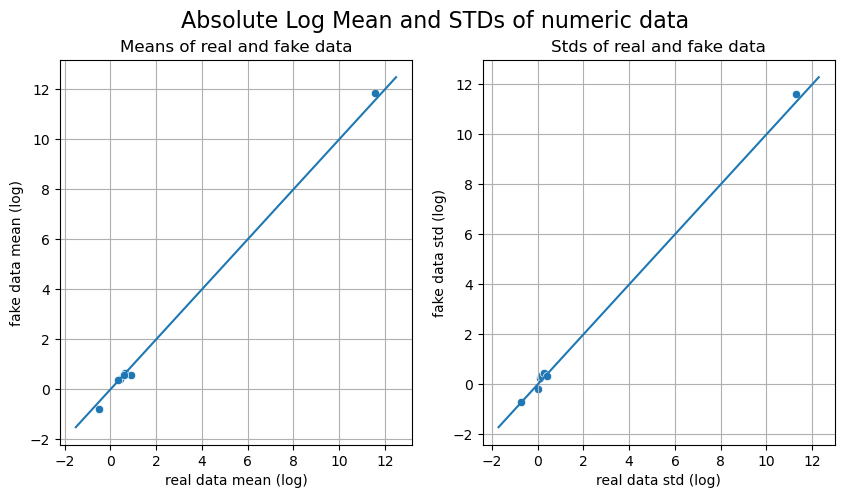

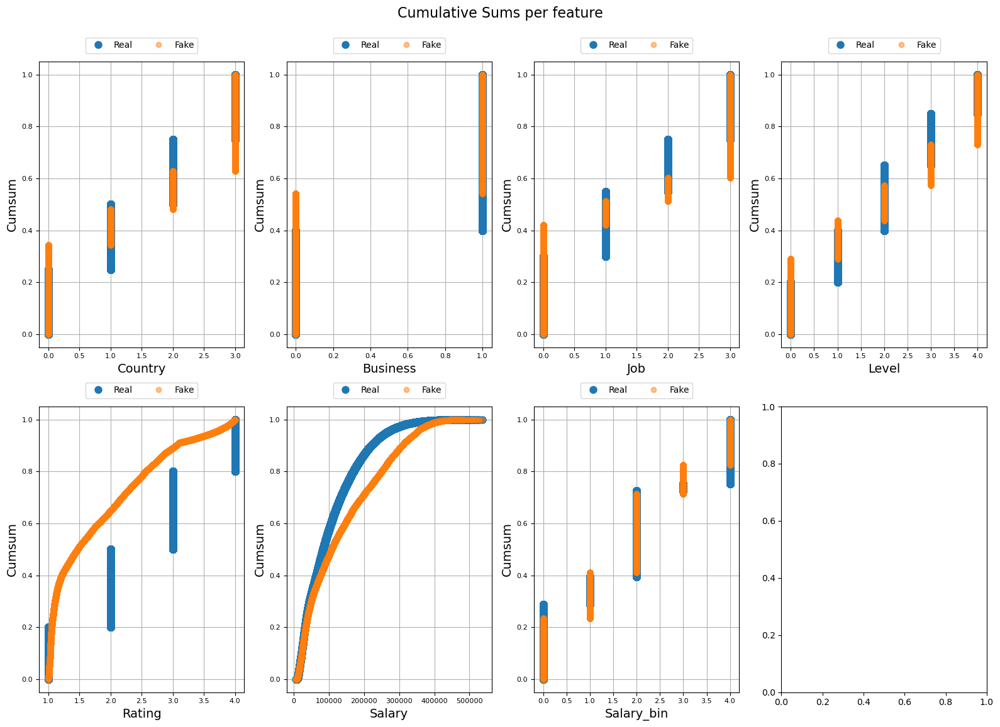

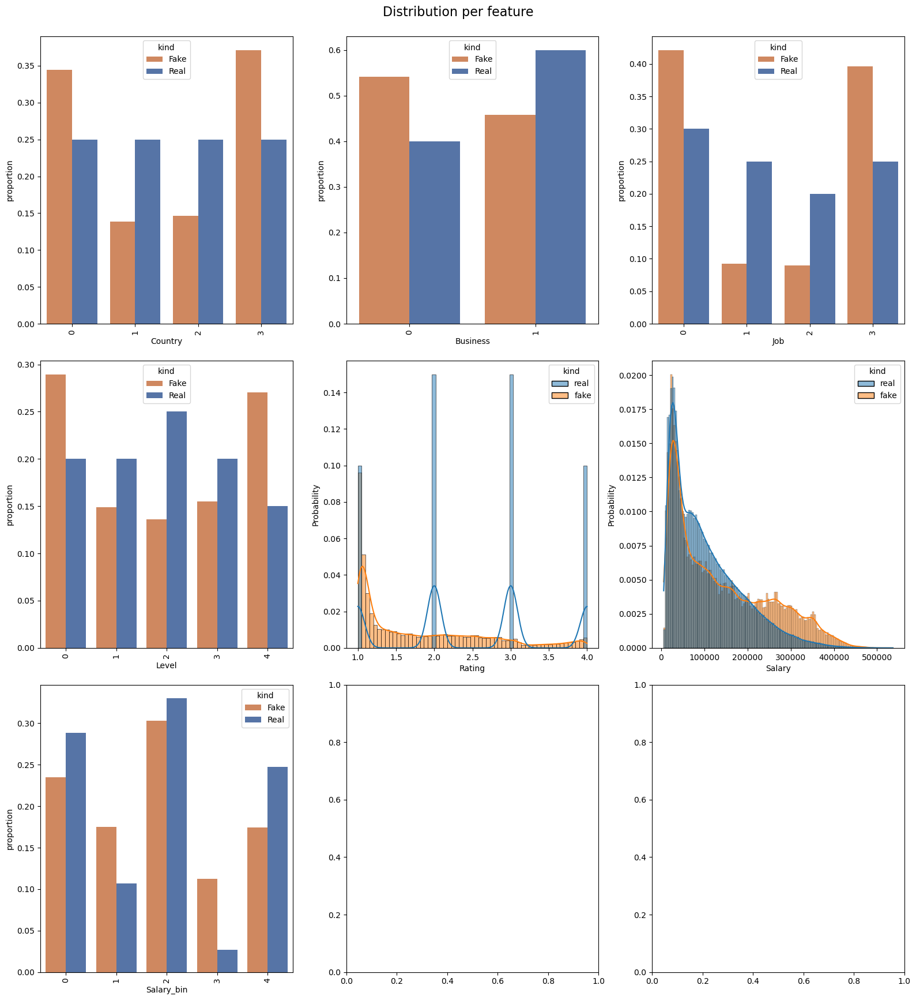

D:\ComputerCode\JF_Environments\deep2-env\lib\site-packages\dython\nominal.py:219: RuntimeWarning: Rounded U = -1.6017132519074588e-16 to 0.0. This is probably due to floating point precision issues.
  warnings.warn(


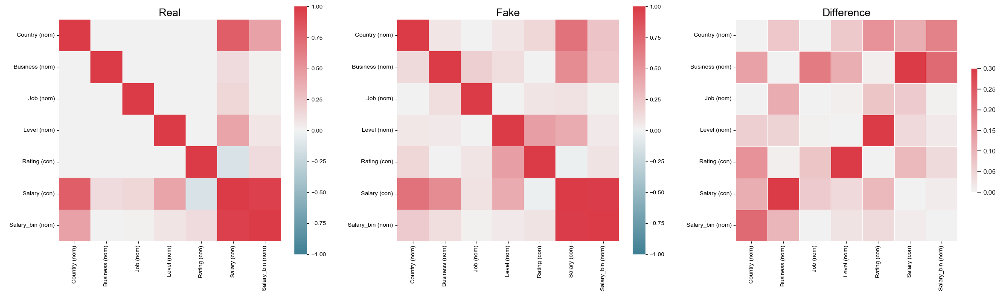

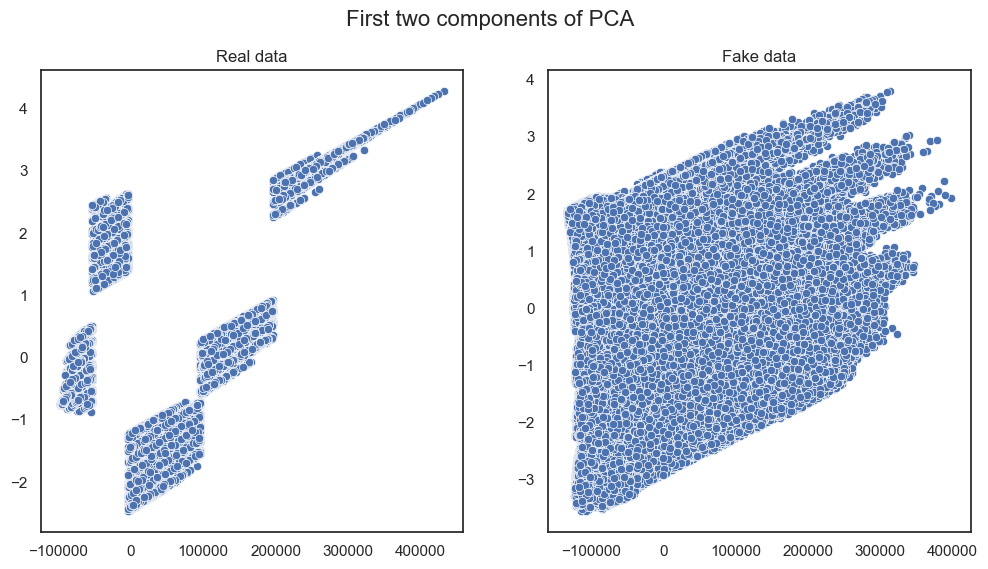

In [10]:
table_evaluator.visual_evaluation()

# Regression with Synthetic Data

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import *

from scipy.stats import norm
from scipy import stats
import time

import matplotlib.pyplot as plt

In [12]:
X = synthetic2.drop(["Salary"], axis=1)
y = synthetic2["Salary"]


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=69)

# Initialze the estimators
reg1 = XGBRegressor(random_state=69)
reg2 = LinearRegression()

#Initiaze the hyperparameters for each dictionary
# This one below took 4 hour but it was BEST!
param1 = {}
param1['regression__n_estimators'] = [500]
param1['regression'] = [reg1]

param2 = {}
param2['regression'] = [reg2]

params = [param1, param2]
#params = [param2]

# Define the column names for hot encoding
hot_encode_columns = ["Country","Business","Job","Level"]

# Create the transformers for your pipeline
column_transformer = ColumnTransformer(
    transformers=[
        ('hot_encode', OneHotEncoder(), hot_encode_columns),
        ('keep', 'passthrough', ['Rating'])  
    ],
    remainder='drop'  # Drop any remaining columns
)

# Define the regression model
#regressor = LinearRegression()

# Create the pipeline
pipeline = Pipeline([
    ('preprocessing', column_transformer),
    ('regression', reg1)], verbose=True)


start_time = time.time()

#### Gridsearch CV
gs = GridSearchCV(pipeline, params, cv=5, n_jobs= -1, scoring='neg_mean_absolute_percentage_error', 
                  verbose = 4, return_train_score=True).fit(X_train, y_train)

(time.time() - start_time) /60

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[Pipeline] ..... (step 1 of 2) Processing preprocessing, total=   0.1s
[Pipeline] ........ (step 2 of 2) Processing regression, total=  39.6s


1.8929328401883443

In [13]:
print("Test R2 Score:",r2_score(gs.predict(X_test), y_test))
print("Test neg. RMSE Score:",mean_squared_error(gs.predict(X_test), y_test))
print("Test neg. MAPE Score:",mean_absolute_percentage_error(gs.predict(X_test), y_test))


Test R2 Score: 0.7909371762333348
Test neg. RMSE Score: 2131702415.5650814
Test neg. MAPE Score: 0.27368996215880653


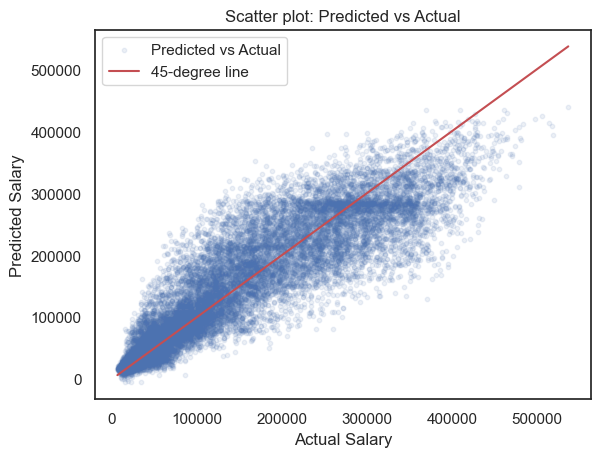

In [14]:
my_predictions = pd.DataFrame(gs.predict(X_test))

# Create a scatter plot
plt.scatter(y_test,my_predictions,  color='b', label='Predicted vs Actual', s=10,alpha=0.1)

# Plot the 45-degree line
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)],color='r', label='45-degree line')


# Set labels and title
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Scatter plot: Predicted vs Actual')

# Add legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
#######################################################################################################################

# Regression with Real Data

In [21]:
X = real.drop(["Salary"], axis=1)
y = real["Salary"]


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=69)

# Initialze the estimators
reg1 = XGBRegressor(random_state=69)
reg2 = LinearRegression()

#Initiaze the hyperparameters for each dictionary
# This one below took 4 hour but it was BEST!
param1 = {}
param1['regression__n_estimators'] = [500]
param1['regression'] = [reg1]

param2 = {}
param2['regression'] = [reg2]

params = [param1, param2]
#params = [param2]

# Define the column names for hot encoding
hot_encode_columns = ["Country","Business","Job","Level"]

# Create the transformers for your pipeline
column_transformer = ColumnTransformer(
    transformers=[
        ('hot_encode', OneHotEncoder(), hot_encode_columns),
        ('keep', 'passthrough', ['Rating'])  
    ],
    remainder='drop'  # Drop any remaining columns
)

# Define the regression model
#regressor = LinearRegression()

# Create the pipeline
pipeline = Pipeline([
    ('preprocessing', column_transformer),
    ('regression', reg1)], verbose=True)


start_time = time.time()

#### Gridsearch CV
gs = GridSearchCV(pipeline, params, cv=5, n_jobs= -1, scoring='neg_mean_absolute_percentage_error', 
                  verbose = 4, return_train_score=True).fit(X_train, y_train)

(time.time() - start_time) /60

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[Pipeline] ..... (step 1 of 2) Processing preprocessing, total=   0.5s
[Pipeline] ........ (step 2 of 2) Processing regression, total=  42.6s


1.8940873543421428

In [22]:
print("Test R2 Score:",r2_score(gs.predict(X_test), y_test))
print("Test neg. RMSE Score:",mean_squared_error(gs.predict(X_test), y_test))
print("Test neg. MAPE Score:",mean_absolute_percentage_error(gs.predict(X_test), y_test))


Test R2 Score: 0.976498580663458
Test neg. RMSE Score: 150746575.33507618
Test neg. MAPE Score: 0.07910876177955879


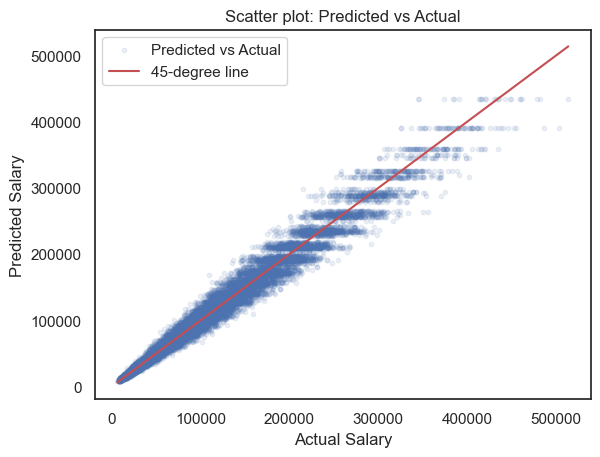

In [23]:
my_predictions = pd.DataFrame(gs.predict(X_test))

# Create a scatter plot
plt.scatter(y_test,my_predictions,  color='b', label='Predicted vs Actual', s=10,alpha=0.1)

# Plot the 45-degree line
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)],color='r', label='45-degree line')


# Set labels and title
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Scatter plot: Predicted vs Actual')

# Add legend
plt.legend()

# Show the plot
plt.show()